In [1]:
import os
import dill as pickle
import matplotlib
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from utils.utils import load_group_results, Result_obj
from stable_baselines.results_plotter import ts2xy
from stable_baselines.bench.monitor import load_results
from utils import extract_param_val

from utils import plot
import re
from tqdm import tqdm
%matplotlib inline

# set up matplotlib

plt.ion()
# plt.rc('font', family='serif', serif='Times')

nice_fonts = {
        # Use LaTeX to write all text
        "text.usetex": True,
        "font.family": "serif",
        # Use 10pt font in plots, to match 10pt font in document
        'axes.titlesize' : 16,
        "axes.labelsize": 16,
        "font.size": 10,
        'font.weight':'bold',
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 6,
        "xtick.labelsize": 12,
        "ytick.labelsize": 12,
        'font.weight':'bold',
        'axes.labelweight': 'bold'
}

sns.axes_style().update(nice_fonts)


/opt/pyenv/versions/3.6.5/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


# group plot for comparing MULTIPOLAR vs training from scratch

In [2]:
# env_algo_xlim_ybase_legend = [
#     ('LunarLanderContinuous-v2', 'sac', int(5e5), 100, False),
#     ('RoboschoolHopper-v1', 'ppo2', int(2e6), 500, False),
#     ('CartPole-v1','ppo2', int(1e5), 100, True), 
#     ('RoboschoolInvertedPendulumSwingup-v1', 'ppo2', int(2e6), 200, False), 
#     ('RoboschoolAnt-v1', 'ppo2', int(2e6), 500, False),  
#     ('Acrobot-v1', 'ppo2', int(2e5), 50, False)]

env_algo_xlim_ybase_legend = [('Acrobot-v1', 'ppo2', int(2e5), 50, False)]

prefixes = ["4sources-3sets-SIW", "1sources-3sets-SIW"]


override=False
save=True

fig_width_inches = 5.5 / 1.0
font_scale = 1.5
color_dict = {'MLP': 'blue', 'MULTIPOLAR(K=1)': 'green', 'MULTIPOLAR(K=4)': 'red'}

###############
# Golden ratio to set aesthetic figure height
golden_ratio = (5**.5 - 1) / 2

# Figure height in inches
fig_height_inches = fig_width_inches * golden_ratio
figsize = (fig_width_inches, fig_height_inches)

>>>> saved LunarLanderContinuous-v2_MainEnginePower1008-SideEnginePower147-Scale400-InitialRandom108873-SideEngineHeight1962-SideEngineAway816
successfully loaded logs/sac_scratch/LunarLanderContinuous-v2_MainEnginePower1057-SideEnginePower095-Scale415-InitialRandom79007-SideEngineHeight1618-SideEngineAway1228_1
successfully loaded logs/sac_scratch/LunarLanderContinuous-v2_MainEnginePower1057-SideEnginePower095-Scale415-InitialRandom79007-SideEngineHeight1618-SideEngineAway1228_2
successfully loaded logs/sac_scratch/LunarLanderContinuous-v2_MainEnginePower1057-SideEnginePower095-Scale415-InitialRandom79007-SideEngineHeight1618-SideEngineAway1228_3
loaded 3 results
successfully loaded logs/mlap-sac/LunarLanderContinuous-v2_4sources-3sets-SIW-MainEnginePower1057-SideEnginePower095-Scale415-InitialRandom79007-SideEngineHeight1618-SideEngineAway1228_1
successfully loaded logs/mlap-sac/LunarLanderContinuous-v2_4sources-3sets-SIW-MainEnginePower1057-SideEnginePower095-Scale415-InitialRandom7

/opt/pyenv/versions/3.6.5/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


>>>> saved MainEnginePower1558-SideEnginePower191-Scale4348-InitialRandom99045-SideEngineHeight1227-SideEngineAway1054
successfully loaded logs/sac_scratch/LunarLanderContinuous-v2_MainEnginePower1561-SideEnginePower185-Scale3859-InitialRandom95691-SideEngineHeight1882-SideEngineAway1258_1
successfully loaded logs/sac_scratch/LunarLanderContinuous-v2_MainEnginePower1561-SideEnginePower185-Scale3859-InitialRandom95691-SideEngineHeight1882-SideEngineAway1258_2
successfully loaded logs/sac_scratch/LunarLanderContinuous-v2_MainEnginePower1561-SideEnginePower185-Scale3859-InitialRandom95691-SideEngineHeight1882-SideEngineAway1258_3
loaded 3 results
successfully loaded logs/mlap-sac/LunarLanderContinuous-v2_4sources-3sets-SIW-MainEnginePower1561-SideEnginePower185-Scale3859-InitialRandom95691-SideEngineHeight1882-SideEngineAway1258_1
successfully loaded logs/mlap-sac/LunarLanderContinuous-v2_4sources-3sets-SIW-MainEnginePower1561-SideEnginePower185-Scale3859-InitialRandom95691-SideEngineHeig

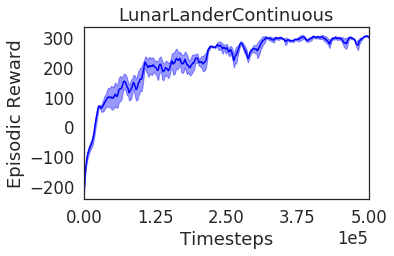

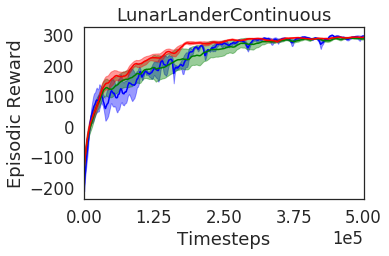

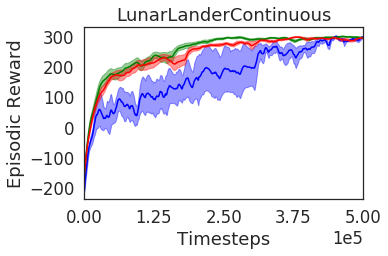

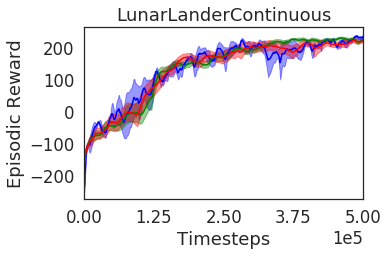

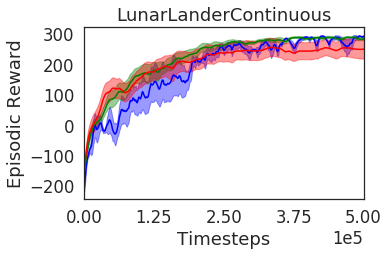

...

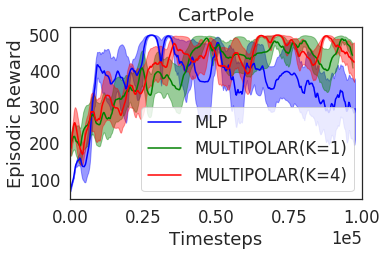

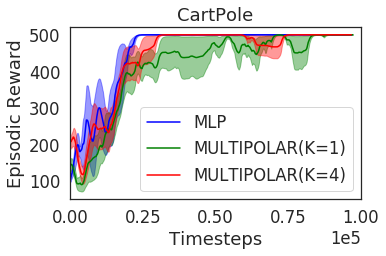

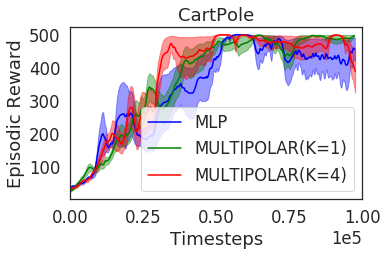

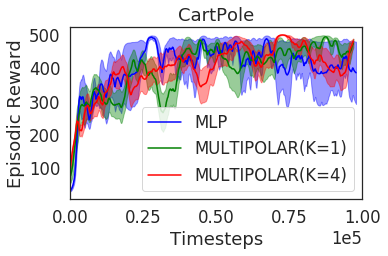

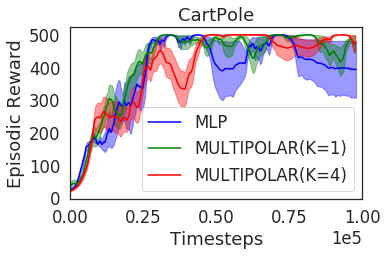

In [ ]:
for env, algo, xlim, ybase, legend in env_algo_xlim_ybase_legend:
    save_path = "logs/{}_analysis/plots".format(env)
    os.makedirs(save_path, exist_ok=True)
    
    for exp in os.listdir('logs/{}'.format(algo)):

        if env in exp and exp[-1]=='1':
            
            # remove the experiment numbder
            exp = exp[:-2] 
            file = os.path.join(save_path, '{}.pkl'.format(exp))
            
            # if file exists, do not load
            if override or not os.path.isfile(file):

                # load results of training from scratch
                results = load_group_results('logs/{}'.format(algo), env=env, verbose=True, mask="^logs/{}/{}_*".format(algo, exp))
                # remove env name from the experiment name
                exp = ''.join(exp.split('_')[1:])
                for p in prefixes:
                    try:
                        results += load_group_results('logs/multipolar-{}/'.format(algo), env='{}_{}'.format(env, p), verbose=True, mask="^((?!no-bias).)*{}_[1-9]$".format(exp))
                    except:
                        pass
                with open(file, 'wb') as f:
                        pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)
                    
            else:
                with open(file, 'rb') as f:
                    results = pickle.load(f)

            # create title
            title = env[:-3]
    #         title = env + '\n'
    #         param_val extract_param_val(exp.split('-'))
    #         for param, val in param_val:
    #             title += '{}:{} '.format(param, val)
    # #             digit = param[ind:]
    # #             param = param[:ind]
    # #             zero_ind = digit.find('0') + 1
    # #             if zero_ind == 0:
    # #                 zero_ind = -2
    # #             title += '{}:{}.{} '.format(param, digit[:zero_ind], digit[zero_ind:])


            # only keep algo name for visualization
            refined_results=[]
            for i in range(len(results)):

                if pd.isnull(results[i][0].r).any() or pd.isnull(results[i][0].t).any():
                    continue

                try:
                    r = {'monitor': results[i][0].astype({"r":'float64', "l":'float64', "t":'float64'})}
                except:
                    results[i][0].r = results[i][0].r.apply(lambda x : str(x).replace('--', '-') )
                    r = {'monitor': results[i][0].astype({"r":'float64', "l":'float64', "t":'float64'})}

                path = results[i][1].split('/')
                config = path[-1]
                name = path[-2]
                if 'multipolar' in name:
                    name="MULTIPOLAR"
                    ind = config.rfind('sources')
                    name += '(K={})'.format(config[ind-1])
                else:
                    name="MLP"

                r['dirname'] = 'logs/{}/{}_{}'.format(name, env, results[i][1].split('_')[-1])
                refined_results.append(Result_obj(**r))

            f, _ = plot.plot_results(refined_results, average_group=True, shaded_std=False, legend_outside=False, xaxis='timesteps', smooth_step=3, title=title, 
                                     font_scale=font_scale, figsize=figsize, color_dict=color_dict, xbase=xlim/4, ybase=ybase, legend=legend)
            try:
                if xlim > 0:
                    plt.xlim([0, xlim])
            except:
                pass
                
            if save:
                f.savefig(os.path.join(save_path, '{}.pdf'.format(exp)), bbox_inches='tight', format='pdf', dpi=300)
                print('>>>> saved {}'.format(exp))
            else:
                plt.show()

# average MLP vs. Multipolar

 32%|███▏      | 652/2010 [00:02<00:05, 256.22it/s]

0        -722.624451
1        -669.103122
2        -472.168477
3        -345.479924
4       -1054.409498
5       -1555.085706
6        -436.254478
7        -621.580095
8        -491.785247
9       -1578.567289
10       -336.158654
11       -642.162828
12       -897.433347
13        -922.03672
14       -727.512663
15        -324.57708
16       -240.005597
17        156.397627
18        181.965238
19        176.482094
20       1197.146283
21        120.064548
22         92.510932
23        122.603353
24        122.836983
25        145.484654
26        -72.921969
27          6.137722
28         -65.91699
29        -23.497545
            ...     
4466      320.919124
4467      329.237353
4468      285.301155
4469      313.816197
4470      324.554907
4471      326.250968
4472      304.605877
4473      335.031802
4474      284.584298
4475      289.703363
4476       319.33265
4477       301.42758
4478      302.434465
4479      298.158154
4480       329.95742
4481      272.489682
4482      309

100%|██████████| 2010/2010 [00:08<00:00, 228.35it/s]


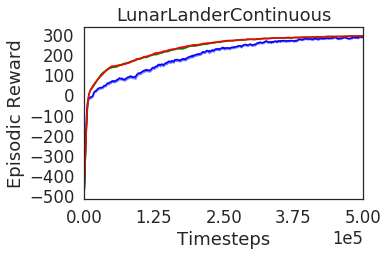

100%|██████████| 2076/2076 [00:22<00:00, 90.94it/s] 


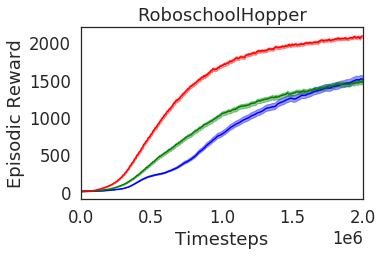

100%|██████████| 1775/1775 [00:07<00:00, 238.65it/s]


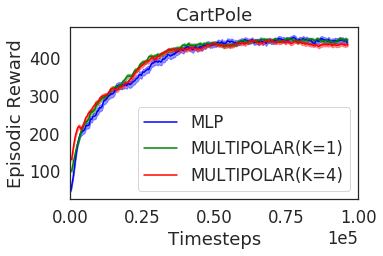

100%|██████████| 1834/1834 [00:08<00:00, 215.75it/s]


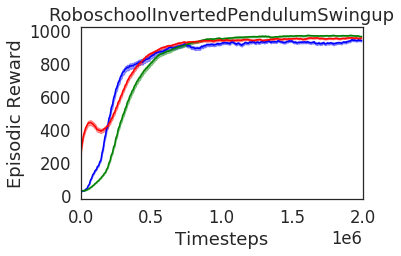

100%|██████████| 2028/2028 [00:09<00:00, 220.74it/s]


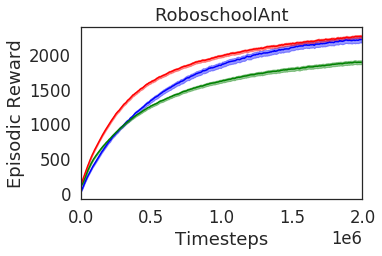

 88%|████████▊ | 1774/2024 [00:08<00:01, 199.28it/s]

0       -194.0
1       -228.0
2       -232.0
3       -254.0
4       -264.0
5       -263.0
6       -275.0
7       -300.0
8       -301.0
9       -303.0
10      -303.0
11      -311.0
12      -354.0
13      -375.0
14      -428.0
15      -445.0
16      -267.0
17      -315.0
18      -299.0
19      -286.0
20      -349.0
21      -268.0
22      -353.0
23      -358.0
24      -392.0
25      -405.0
26      -318.0
27      -379.0
28      -248.0
29      -396.0
         ...  
1245    -101.0
1246    -107.0
1247    -110.0
1248    -135.0
1249    -114.0
1250    -103.0
1251    -107.0
1252    -103.0
1253     -98.0
1254    -126.0
1255    -141.0
1256    -121.0
1257    -103.0
1258    -120.0
1259    -108.0
1260    -103.0
1261    -109.0
1262    -110.0
1263    -107.0
1264    -108.0
1265    -122.0
1266    -103.0
1267    -109.0
1268    -105.0
1269    -112.0
1270    -103.0
1271    -110.0
1272     -99.0
1273    -123.0
1274    -113.0
Name: r, Length: 1275, dtype: object


100%|██████████| 2024/2024 [00:09<00:00, 214.70it/s]


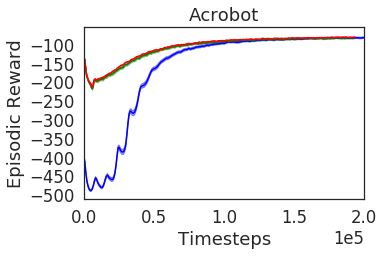

In [14]:
for env, algo, xlim, ybase, legend in env_algo_xlim_ybase_legend:
    #try:
    save_path = "logs/{}_analysis/plots".format(env)
    file = os.path.join(save_path, 'all.pkl')
    if override or not os.path.isfile(file):
        # load results of training from scratch
        results = load_group_results('logs/{}'.format(algo), env=env, verbose=True)

        for p in prefixes:
            try:
                results += load_group_results('logs/multipolar-{}/'.format(algo), env='{}_{}'.format(env, p), verbose=True, mask='^((?!no-bias).)*$')
            except:
                pass
            with open(file, 'wb') as f:
                pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)
    else:
        with open(file, 'rb') as f:
            results = pickle.load(f)

    # create title
    title = env[:-3]
    refined_results=[]
    # only keep algo name for visualization
    for i in tqdm(range(len(results))):

        if pd.isnull(results[i][0].r).any() or pd.isnull(results[i][0].l).any():
            continue

        try:
            r = {'monitor': results[i][0].astype({"r":'float64', "l":'float64', "t":'float64'})}
        except:
            results[i][0].r = results[i][0].r.apply(lambda x : str(x).replace('--', '-') )
            print(results[i][0].r)
            r = {'monitor': results[i][0].astype({"r":'float64', "l":'float64', "t":'float64'})}

        path = results[i][1].split('/')
        config = path[-1]
        name = path[-2]


        if 'multipolar' in name:
            name="MULTIPOLAR"
            ind = config.rfind('sources')
            name += '(K={})'.format(config[ind-1])
        else:
            name="MLP"

        r['dirname'] = 'logs/{}/{}_{}'.format(name, env, results[i][1].split('_')[-1])

        refined_results.append(Result_obj(**r))

    f, _ = plot.plot_results(refined_results, average_group=True, shaded_std=False, shaded_err=True, legend_outside=False, xaxis='timesteps', title=title, 
                             font_scale=font_scale, figsize=figsize, color_dict=color_dict, xbase=xlim/4, ybase=ybase, legend=legend)
    try:
        if xlim > 0:
            plt.xlim([0, xlim])
    except:
        pass

    if save:
        save_path = "logs/{}_analysis/plots".format(env)
        os.makedirs(save_path, exist_ok=True)
        f.savefig(os.path.join(save_path, 'all.pdf'), bbox_inches='tight', format='pdf', dpi=300)
    else:
        plt.show()
    plt.show()
#     except:
#         print

In [11]:
len(results)

2076

# load results from the given path with regular expression

In [44]:
results = load_group_results('logs/ppo2/', verbose=True, mask="^logs/ppo2/.*max-speed2.*")
results += load_group_results('logs/ppo2/', verbose=True, mask="^logs/ppo2/.*orig.*")

successfully loaded logs/ppo2/MountainCar-v0_max-speed2_1
loaded 1 results
successfully loaded logs/ppo2/MountainCar-v0_orig_1
loaded 1 results


(<Figure size 1263.6x595.44 with 1 Axes>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7eff94bf1048>]],
       dtype=object))

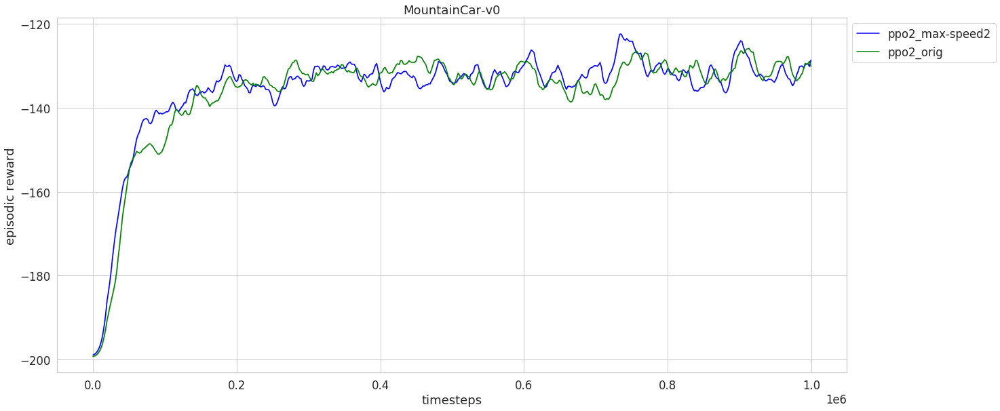

In [45]:
plot.plot_results(results, average_group=True, shaded_std=False, ybase=20, legend_outside=True, xaxis='timesteps', smooth_step=3, style='whitegrid')

#### evaluate the success rate

In [3]:
thresh = 200

In [7]:
avg_last_hundred_ep = []
for r in results:
    x, y = ts2xy(r.monitor, 'episodes')
    avg_last_hundred_ep.append(np.mean(y[-100:]))
avg_last_hundred_ep = np.array(sorted(avg_last_hundred_ep))

In [8]:
sum(avg_last_hundred_ep >= thresh) / 300

0.97